# Spatial filtering

**In this lecture, we will learn**
- how image filtering by convolution works and how to implement it,
- about available implementations and how to use them properly,
- how to speed-up convolution utilizing filter separability.
- filter both linear and nonlinear noise from images.

**The lecture is based on**
- Chapter 4 "Filters" of  
  [\[Burger22\] Wilhelm Burger, Mark J. Burge: *Digital Image Processing: An Algorithmic Introduction (3rd edition)*](https://imagingbook.com/books/english-edition-hardcover/)

In [1]:
from typing import Callable, Optional, Union

import cv2 as cv
import ipywidgets
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import scipy.ndimage
import skimage

In [2]:
plt.rcParams['figure.constrained_layout.use'] = True
np.set_printoptions(threshold=20, edgeitems=10, linewidth=140, precision=3, suppress=True)

In [3]:
def imshow_grid(
        nrows: Optional[int] = None,
        ncols: Optional[int] = None,
        cmap: str = 'gray',
        vmin: Union[int, float] = 0,
        vmax: Union[int, float] = None,
        grid: bool = False,
        colorbar: bool = True,
        **images
):
    if nrows is None:
        nrows = 1
    if ncols is None:
        ncols = -int(-len(images) // nrows)  # ceil
    fig_size_y = nrows * plt.rcParams['figure.figsize'][1]
    fig_size_x = max(1, ncols / 2) * plt.rcParams['figure.figsize'][0]
    fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(fig_size_x, fig_size_y), layout='constrained')
    axes = np.atleast_1d(axes)
    for ax, (name, img) in zip(axes.flat, images.items()):
        _vmax = vmax
        if _vmax is None:
            _vmax = np.iinfo(img.dtype).max if np.issubdtype(img.dtype, np.integer) else 1.
        im = ax.imshow(img, cmap=cmap, vmin=vmin, vmax=_vmax)
        ax.grid(grid)
        ax.set_title(name)
    if colorbar:
        if ncols > nrows:
            orientation = 'horizontal'
        elif ncols == nrows:
            orientation = 'horizontal' if im.get_size()[1] > im.get_size()[0] else 'vertical'
        else:
            orientation = 'vertical'
        fig.colorbar(im, ax=axes, orientation=orientation, aspect=50)
    return fig, axes

In [4]:
rgb = skimage.io.imread('../data/robot.bmp')
rgb = skimage.util.img_as_float(rgb)
rgb.shape, rgb.dtype, rgb.min(), rgb.max()

((234, 160, 3), dtype('float64'), 0.0, 1.0)

In [5]:
gray = skimage.color.rgb2gray(rgb)
gray.shape, gray.dtype, gray.min(), gray.max()

((234, 160), dtype('float64'), 0.0, 1.0)

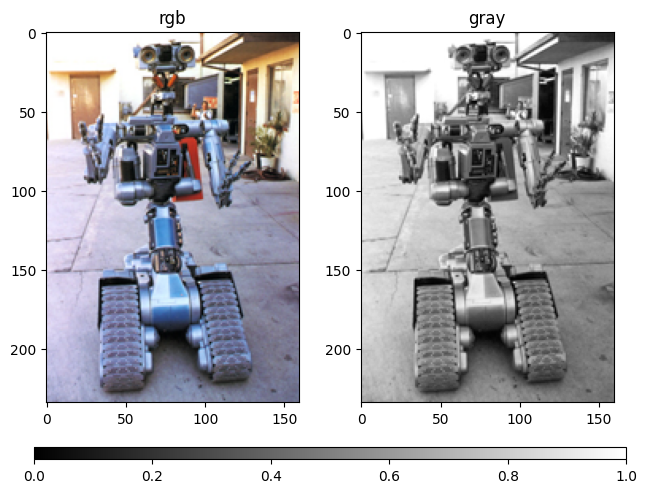

In [6]:
imshow_grid(rgb=rgb, gray=gray);

# Filters

- Each pixel value of an image processed by some intensity transformation only depends on the original pixel at the same position.
- Because of this property, intensity transformations cannot accomplish e.g. sharpening of smoothing.
- This is where filters come in.
- Filters generally use more than one pixel from the source image for computing each new pixel value.
- Like intensity transformations, they still, however, do not change image geometry.

<figure class="image">
  <img src="../figures/spatial_filtering-filter_principle.png" alt="" style="width: 6.4in;"/>
  <figcaption>Source: [Burger22], Fig. 4.2</figcaption>
</figure>

# Additive noise model

- We will motivate this lecture with a noise filtering application.
- We will assume that the noise value $\nu$ at each pixel is an independent random variable with zero and standard deviation $\sigma$ and that the observed value of image $f(x,y)$ at position $(x,y)$ is a sum of the true (but unknown) source value $s(x,y)$ and noise $\nu$
  $$
  f(x,y) = s(x,y) + \nu(x,y)
  $$
- Very often, $\nu$ comes from a normal (Gaussian) distribution, i.e. $\nu(x,y)\sim\mathcal{N}(0,\sigma)$.

In [7]:
rgb_gn = skimage.util.random_noise(rgb, mode='gaussian', var=0.01)
rgb_gn.shape, rgb_gn.dtype, rgb_gn.min(), rgb_gn.max()

((234, 160, 3), dtype('float64'), 0.0, 1.0)

In [8]:
gray_gn = skimage.util.random_noise(gray, mode='gaussian', var=0.01)
gray_gn.shape, gray_gn.dtype, gray_gn.min(), gray_gn.max()

((234, 160), dtype('float64'), 0.0, 1.0)

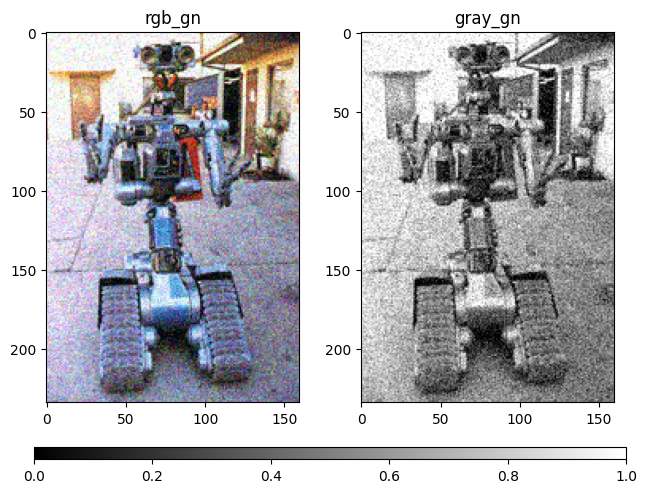

In [9]:
imshow_grid(rgb_gn=rgb_gn, gray_gn=gray_gn);

# Image smoothing using local averaging

- A simple idea how to smooth an image is to replace each pixel with an average of its neighborhood.
- For example, if the neighborhood is a $3 \times 3$ square area, we would do
  $$
  \begin{align*}
  g(m,n) &= \frac{1}{9} \cdot (
    &    &f(m-1,n-1) &+ &f(m-1,n) &+ &f(m-1,n+1) \\
    & &+ &f(m,  n-1) &+ &f(m,  n) &+ &f(m,n+1) \\
    & &+ &f(m+1,n-1) &+ &f(m+1,n) &+ &f(m+1,n+1) )
  &\end{align*}
  $$
  where
  - $f$ is our observed image corrupted with noise,
  - $g$ is the restored (smoothed) image.
- More generally, if the neighborhood is a square region of size $K \times K$, we can write the averaging as
  $$
  g(m,n) = \frac{1}{K^2}\cdot\sum_{u=-K/2}^{+K/2}\sum_{v=-K/2}^{+K/2}{f(m+u,n+v)}
  $$
- Results of this method are acceptable if the noise is in smaller size than the smallest objects of interest in the image.
- **Blurring of edges** is a serious disadvantage.

In [10]:
def local_average(img: np.ndarray, wnd_size: int = 3) -> np.ndarray:
    img_r = np.zeros_like(img)
    half = wnd_size // 2
    for row in range(half, img.shape[0] - half):
        for col in range(half, img.shape[1] - half):
            window = img[row-half:row+half+1, col-half:col+half+1]
            img_r[row, col] = window.mean(axis=(0, 1))
    return img_r

In [11]:
gray_gn_r = local_average(gray_gn, wnd_size=3)
gray_gn_r.shape, gray_gn_r.shape, gray_gn_r.min(), gray_gn_r.max()

((234, 160), (234, 160), 0.0, 1.0)

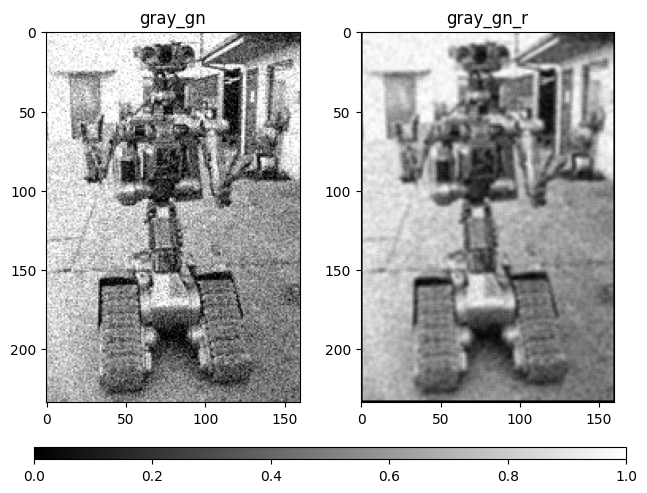

In [12]:
imshow_grid(gray_gn=gray_gn, gray_gn_r=gray_gn_r);

In [13]:
rgb_gn_r = local_average(rgb_gn, wnd_size=3)
rgb_gn_r.shape, rgb_gn_r.shape, rgb_gn_r.min(), rgb_gn_r.max()

((234, 160, 3), (234, 160, 3), 0.0, 1.0)

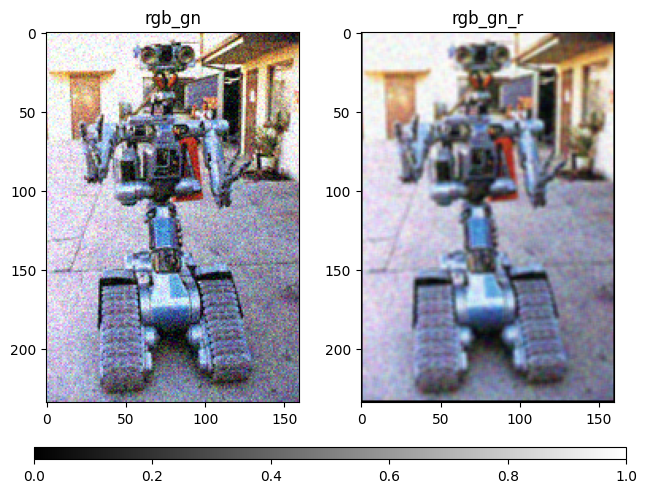

In [14]:
imshow_grid(rgb_gn=rgb_gn, rgb_gn_r=rgb_gn_r);

# Linear filters

- Linear filters are a special class of filters that combine the the values in the neighborhood in a linear fashion.
- In other words, the value of $g$ at position $(m,n)$ is a linear function of values in neighborhood of $(m,n)$ at $f$.
- In its most general form, $g(m,n)$ will be a linear combination of values of $f(u,v)$ using some weights $h(i,j)$, a.k.a.
  $$
  g(m,n) = \sum_{(i,j) \in \mathcal{H}}{ f(m+i,n+j) \cdot h(i,j) }
  $$
  where
  - $\mathcal{H}$ is a set of neighborhood coordinates, a.k.a. the shape of the filter kernel

**Filter kernel**
- Often we call the $h(i,j)$ the filter kernel.
- In principle, it is a function with the same characteristics as the input image $f$.
- One difference, however, is that its coordinate system is set tup such that the origin $(0,0)$ is at the center instead of the top left corner.
- The origin has many different names: *anchor point*, *hot spot*, and others.

<figure class="image">
  <img src="../figures/spatial_filtering-filter_coordinates.png" alt="" style="width: 6.4in;"/>
  <figcaption>Filter kernel. Source: [Burger22], Fig. 4.3</figcaption>
</figure>

- For example, the local $3 \times 3$ averaging above would correspond to a filter
  $$
  h(i,j) = \frac{1}{9} \qquad \forall i = -1, \ldots, +1, \forall j = -1, \ldots, +1
  $$
- Expressed as a matrix, the local averaging filter kernel would be
  $$
  \bold{h} = \begin{bmatrix}
    1/9 & 1/9 & 1/9 \\
    1/9 & 1/9 & 1/9 \\
    1/9 & 1/9 & 1/9 \\
  \end{bmatrix}
  =
  \frac{1}{9} \cdot \begin{bmatrix}
    1 & 1 & 1 \\
    1 & 1 & 1 \\
    1 & 1 & 1 \\
  \end{bmatrix}
  $$

**Applying the filter**

- We will consider the input image $f$ also in its matrix form, i.e. as an $M \times N$ matrix.
- At some position $(m,n)$, the filter kernel is moved such that its origin $h(0,0)$ coincides with $(m,n)$.
- All filter weights are multiplied with corresponding image elements and results are summed up.
- The output value of this computation is the result $g(m,n)$ at position $(m,n)$.
- We repeat this operation for every position $(m,n)$.

<figure class="image">
  <img src="../figures/spatial_filtering-convolution.png" alt="" style="width: 6.4in;"/>
  <figcaption>Linear filtering operation. Source: [Burger22], Fig. 4.4</figcaption>
</figure>

In [15]:
def linear_filter(gray: np.ndarray, kernel: np.ndarray) -> np.ndarray:
    out = np.zeros_like(gray)
    img_h, img_w = gray.shape
    k_h, k_w = kernel.shape
    for y in range(k_h // 2, img_h - k_h // 2):
        for x in range(k_w // 2, img_w - k_w // 2):
            window = gray[y-k_h//2:y+k_h//2+1, x-k_w//2:x+k_w//2+1]
            out[y, x] = np.sum(kernel * window)
    return out

In [16]:
kernel = 1/9 * np.ones((3, 3))
kernel

array([[0.111, 0.111, 0.111],
       [0.111, 0.111, 0.111],
       [0.111, 0.111, 0.111]])

In [17]:
gray_gn_rf = linear_filter(gray_gn, kernel)
gray_gn_rf.shape, gray_gn_rf.shape, gray_gn_rf.min(), gray_gn_rf.max()

((234, 160), (234, 160), 0.0, 1.0)

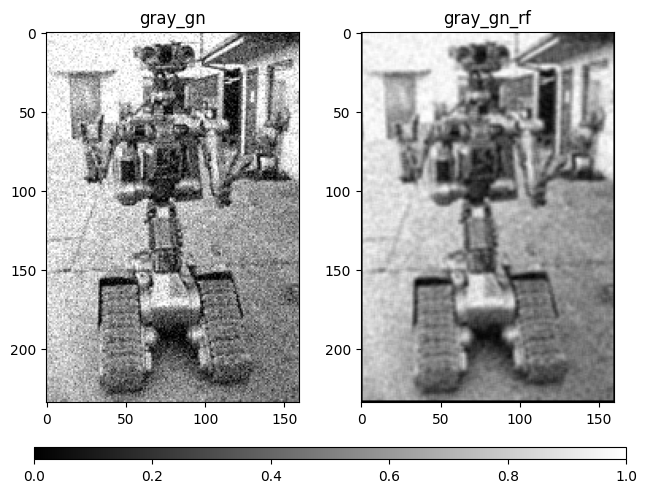

In [18]:
imshow_grid(gray_gn=gray_gn, gray_gn_rf=gray_gn_rf);

In [19]:
# verify that linear filter result is the same as explicit local averaging
np.sum(np.abs(gray_gn_rf - gray_gn_r))

1.9287817870639046e-12

# Convolution

- What we did above can be cast as a standard mathematical operation called convolution.
- A discrete 2D convolution is
  $$
  g(x,y) = \sum_{i=-\infty}^{+\infty}\sum_{j=-\infty}^{+\infty}{f(x-i,y-j) \cdot h(i,j)}
  $$
  often denoted briefly using operator $*$ as
  $$
  g = f * h
  $$
- This *almost* describes the local averaging using linear filtering operation.
- There are **two differences**, however:
  1. *The sum goes from $-\infty$ to $+\infty$*.
     - The function $h(i,j)$ has zero values outside the neighborhood region.
  2. *There is a minus sign in the coordinates of $f(m-i,n-j)$*.
     - This is due to mathematical properties (e.g. see convolution theorem in the [frequency_domain](frequency-domain.ipynb) lecture).
     - We can expand as follows
       $$
       \begin{align*}
         g(x,y) &= \sum_{(i,j)}{f(x-i,y-j) \cdot h(i,j)} \\
                &= \sum_{(i,j)}{f(x+i,y+j) \cdot h(-i,-j)} \\
                &= \sum_{(i,j)}{f(x+i,y+j) \cdot h^{\diamond}(i,j)} \\
       \end{align*}
       $$
       where $h^{\diamond}(i,j) = h(-i,-j)$.
     - **We can see that the convolution operation corresponds to linear filtering with a horizontally and vertically flipped kernel.**
- If there is no kernel flipping, the operation is often called **linear correlation**.

<figure class="image">
  <img src="../figures/spatial_filtering-convolution_animation.gif" alt="" style="width: 6.4in;"/>
  <figcaption>
    Illustration of 2D discrete convolution. Source:
    <a href="https://en.wikipedia.org/wiki/Convolution#Discrete_convolution">Wikipedia</a>
  </figcaption>
</figure>


**Convolution properties**

- Is commutative
  $$
  f * h = h * f
  $$
- Is linear, because satisfies both homogenity
  $$
  (\alpha \cdot f) * h = f * (\alpha \cdot h) = \alpha \cdot (f * h)
  $$
  and additivity
  $$
  (f_1 + f_2) * h = (f_1 * h) + (f_2 * h)
  $$
- Is associative
  $$
  (f * h_1) * h_2 = f * (h_1 * h_2)
  $$
- Is *not* "additively covariant" (this is not a standard term), i.e. adding a constant *does not* add to the convolved result by the same amount
  $$
  (f + \beta) * h \ne f * h + \beta
  $$

In [20]:
def conv2d_simple(gray: np.ndarray, kernel: np.ndarray) -> np.ndarray:
    kernel = kernel[::-1, ::-1]  # flip both rows and cols
    return linear_filter(gray, kernel)

In [21]:
gray_gn_rc = conv2d_simple(gray_gn, kernel)
gray_gn_rc.shape, gray_gn_rc.shape, gray_gn_rc.min(), gray_gn_rc.max()

((234, 160), (234, 160), 0.0, 1.0)

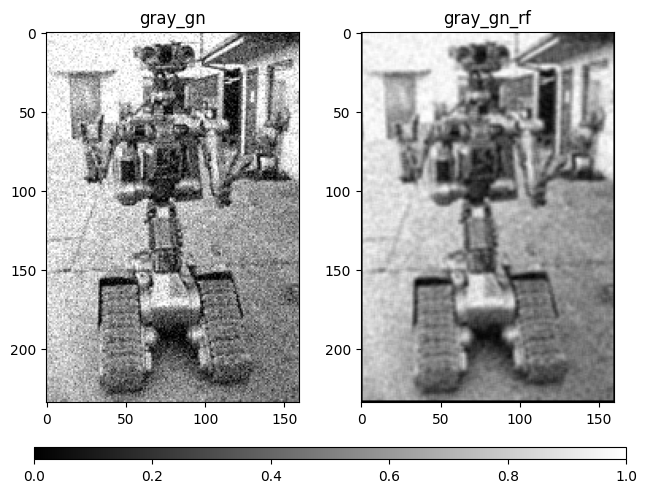

In [22]:
imshow_grid(gray_gn=gray_gn, gray_gn_rf=gray_gn_rf);

In [23]:
# verify that convolution result is the same as linear filter
np.sum(np.abs(gray_gn_rc - gray_gn_rf))

0.0

## Handling image borders

- What about the thin black border around the blurred image?
- We skipped positions where the kernel matrix is not fully contained in the image.
- Since they were initialized to zero, they remained black.
- This effectively decreased the image size by $K - 1$.
- In practice, we resolve issue with **padding**.

**Padding**
- Padding means expanding (extrapolating) the input image $f$ so that the filter kernel is fully contained in the expanded image for all possible locations.
- There is no "correct" way to do this.

The most popular padding methods are
1. **Constant padding**
   - The pixels outside of the image $f$ will have a constant value.
   - Most commonly, the value will be zero $\rightarrow$ **zero padding** (nowadays by far the most common way of padding e.g. in convolutional neural networks).
2. **Border copy**
   - The pixels outside of the image $f$ will have a value of the nearest border.
3. **Image mirroring**
   - The pixels outside of the image $f$ will be mirroring the image, i.e. horizontally to the left or right or vertically to the above and below.
4. **Image repetition**
   - Image is made periodic.
   - For example, the first pixel after the right most will have value of the left-most.

**Output image size**
- For simplicity, we'll assume a square image of size $M \times M$ and square kernel of size $K \times K$.
- We'll apply padding of size $P$, i.e. we'll expand the image $f$ to the left, right, above, and below by $P$ pixels.
- The size of the output image $g = f * h$ will be $Q \times Q$, where
  $$
  Q = M + 2\cdot P - K + 1
  $$

In [24]:
def conv2d(
    gray: np.ndarray,
    kernel: np.ndarray,
    pad: int = 0,
    mode: str = 'constant',
) -> np.ndarray:
    # Get the input height and width
    i_h, i_w = gray.shape
    # Pad the input
    gray = np.pad(gray, pad, mode=mode)
    p_y, p_x = (gray.shape[0] - i_h) // 2, (gray.shape[1] - i_w) // 2
    # Flip the kernel
    kernel = kernel[::-1, ::-1]
    # Get the kernel shape
    k_h, k_w = kernel.shape
    # Calculate the output height and width
    o_h, o_w = i_h + 2 * p_y - k_h + 1, i_w + 2 * p_x - k_w + 1
    # Initialize the output
    out = np.zeros((o_h, o_w), dtype=gray.dtype)
    # Perform linear filtering
    for m in range(o_h):
        for n in range(o_w):
            # Extract the neighborhood
            window = gray[m:m+k_h, n:n+k_w]
            # Compute and store the value of the convolution at position (m,n)
            out[m, n] = np.sum(kernel * window)
    return out

In [25]:
gray_gn_rcp = conv2d(gray_gn, kernel, pad=1, mode='constant')
gray_gn_rcp.shape, gray_gn_rcp.shape, gray_gn_rcp.min(), gray_gn_rcp.max()

((234, 160), (234, 160), 0.008280681445121181, 1.0)

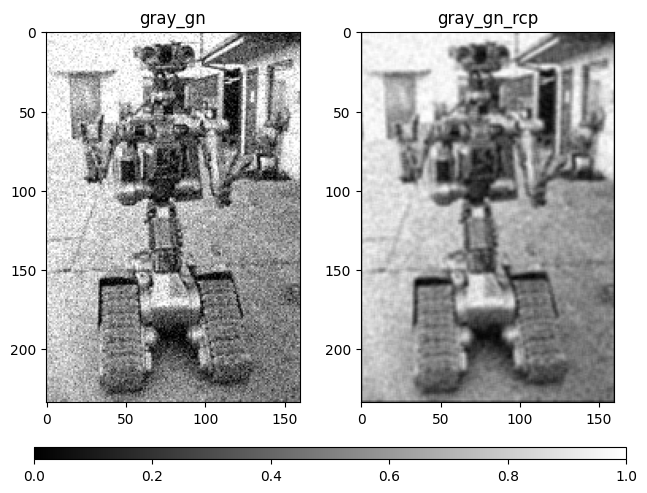

In [26]:
imshow_grid(gray_gn=gray_gn, gray_gn_rcp=gray_gn_rcp);

## Choice of kernel: blur, edges, emboss, identity, outline, sharpen

- The result of the convolution $g = f * h$ is completely and sufficiently specified by the kernel $h$.
- Depending on the choice of $h$, we may acomplish very different effects.
- See examples below.

In [27]:
kernels = {
    'identity': np.array([
        [0., 0., 0.],
        [0., 1., 0.],
        [0., 0., 0.],
    ]),
    'local averaging': np.array([
        [1/9, 1/9, 1/9],
        [1/9, 1/9, 1/9],
        [1/9, 1/9, 1/9],
    ]),
    'Gaussian-like averaging (blurring)': np.array([
        [1/16, 1/8, 1/16],
        [1/8,  1/4, 1/8],
        [1/16, 1/8, 1/16],
    ]),
    'sharpen': np.array([
        [ 0., -1.,  0.],
        [-1.,  5., -1.],
        [ 0., -1.,  0.],
    ]),
    'emboss': np.array([
        [-2., -1., 0.],
        [-1.,  1., 1.],
        [0.,   1., 2.],
    ]),
    'outline': np.array([
        [-1., -1., -1.],
        [-1.,  8., -1.],
        [-1., -1., -1.],
    ]),
    'horizontal Sobel edges': np.array([
        [-1., -2., -1.],
        [0.,  0.,  0. ],
        [1.,  2.,  1. ],
    ]),
    'vertical Sobel edges': np.array([
        [-1., 0., 1.],
        [-2., 0., 2.],
        [-1., 0., 1.],
    ]),
}

In [28]:
# Convolve with all kernels
gray_convs = {
    name: conv2d(gray, kernel, pad=0)
    for name, kernel in kernels.items()
}

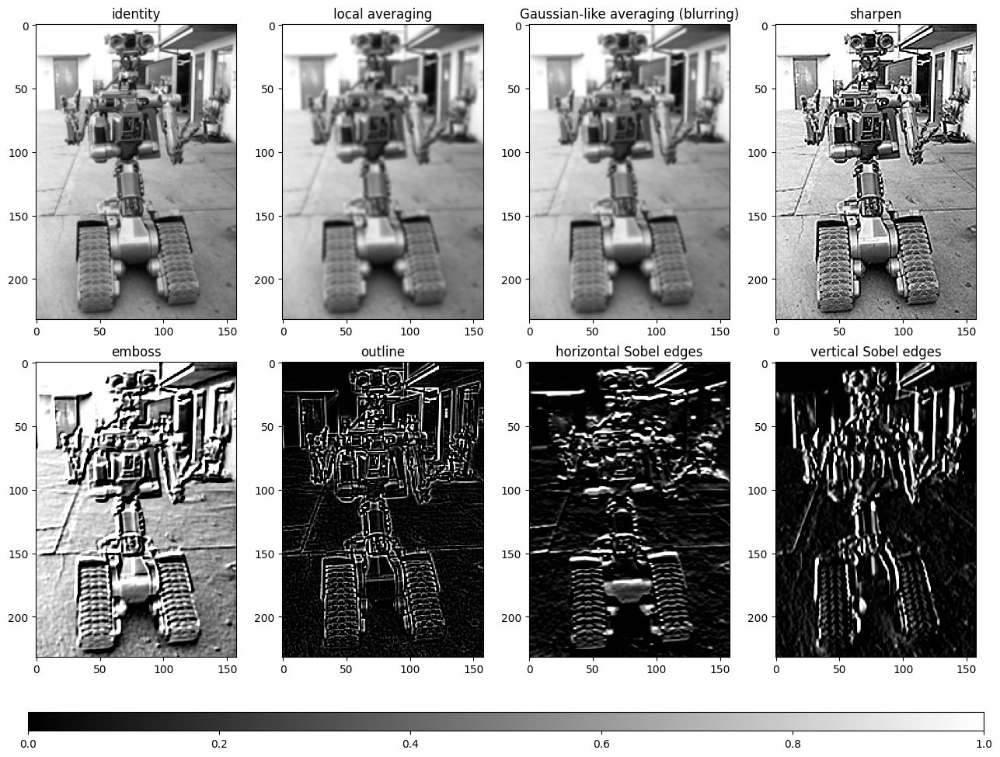

In [29]:
imshow_grid(2, **gray_convs);

## Gaussian filter

- We're going to define the discrete Gaussian filter as a sampled version of the continuous 2D Gaussian function, i.e.
  $$
  h_\textrm{gauss}(m,n; \sigma) = a \cdot \exp\left(-\frac{m^2 + n^2}{2\cdot\sigma^2}\right)
  $$
  where
  - $m = -L, \ldots, +L$ and $n = -L, \ldots, +L$, with $L$ denoting half of the kernel size $K$, i.e. $L = K/2$,
  - $\sigma$ is the standard deviation and a free hyperparameter,
  - and we choose $a$ such that
    $$
    \sum_{(m,n) \in \mathcal{H}}{h_\textrm{gauss}(m,n; \sigma)} = 1
    $$
- The Gaussian filter is defined by its standard deviation $\sigma$.
- We derive corresponding kernel size $K$ based on $\sigma$, for example as
  $$
  K = 3 \cdot \sigma \qquad \textrm{or} \qquad K = 6 \cdot \sigma
  $$
- In contrast to the box filter (local averaging over rectangular neighborhood), **Gaussian filter is isotropic**, meaning it blurs by the same amount in all directions.
- Also has better properties in frequency domain and therefore often used e.g. for creation of scale space for the purposes of multi-resolution processing (image pyramids, blob detection, etc.).

In [30]:
def gaussian_filter(gray: np.ndarray, sigma: float = 1.) -> np.ndarray:
    half_size = int(0.5 + 3 * sigma)  # (L,)
    m = np.linspace(-half_size, half_size, 2 * half_size + 1)  # (2*L+1,)
    n = np.linspace(-half_size, half_size, 2 * half_size + 1)  # (2*L+1,)
    mgrid, ngrid = np.meshgrid(m, n)  # (2*L+1, 2*L+1), (2*L+1, 2*L+1)
    kernel = np.exp(-(mgrid ** 2 + ngrid ** 2) / (2 * sigma ** 2))  # (2*L+1, 2*L+1)
    kernel /= kernel.sum()
    return conv2d(gray, kernel, pad=half_size, mode='reflect')

In [31]:
# Try more sigmas
gray_gbs = {
    f"gray_gb_sigma_{sigma:g}": gaussian_filter(gray, sigma=sigma)
    for sigma in (1., 2., 3., 4.)
}

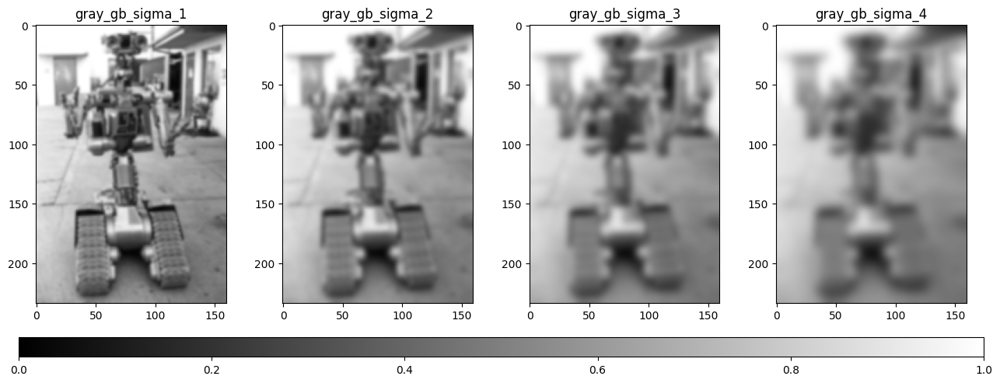

In [32]:
imshow_grid(**gray_gbs);

## Unsharp masking

- Perhaps surprisingly, image blurring can be used for sharpening.
- This idea is the basis for *unsharp masking*, see. [Wikipedia](https://en.wikipedia.org/wiki/Unsharp_masking).  

Unsharp masking works in two steps:
1. A "mask" image $d$ is generated as
   $$
   d = f - (f * h_{\textrm{smooth}})
   $$
   where $h_{\textrm{smooth}}$ is some smoothing filter, typically Gaussian.
2. Sharpened image $g$ is produced by adding the scaled "mask" image to the original
   $$
   g = f + \alpha \cdot d
   $$
   where $\alpha \in \mathbb{R}$ is a coefficient controlling the amount of sharpening.

<figure class="image">
  <img src="../figures/spatial_filtering-unsharp_masking.png" alt="" style="width: 3.2in;"/>
  <figcaption>Unsharp masking principle. Source: [Gonzalez18], Fig. 3.48</figcaption>
</figure>

In [33]:
gray_gb = gaussian_filter(gray, 3.)
gray_dif = gray - gray_gb
gray_unsharp = np.clip(gray + 0.5 * gray_dif, 0., 1.)

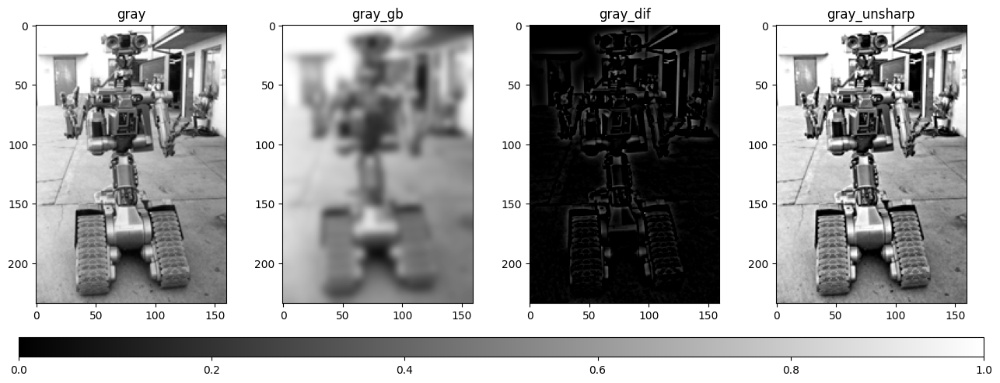

In [34]:
imshow_grid(gray=gray, gray_gb=gray_gb, gray_dif=gray_dif, gray_unsharp=gray_unsharp);

## Implementations of discrete 2D convolution

### Scipy: `scipy.signal.convolve2d`

https://docs.scipy.org/doc/scipy/reference/generated/scipy.signal.convolve2d.html

<figure class="image">
  <img src="../figures/spatial_filtering-scipy_signal_convolve2d.png" alt="" style="width: 6.4in; background: white"/>
  <figcaption>
    `scipy.signal.convolve2d` modes. Source:
    <a href="https://github.com/vdumoulin/conv_arithmetic">Vincent Dumoulin</a>
  </figcaption>
</figure>

In [35]:
gray_gn_rscp = scipy.signal.convolve2d(
    gray,
    kernels['local averaging'],
    mode = 'same',
    boundary = 'symm'  # automatically computes padding
#     fillvalue=0
)
gray_gn_rscp.shape, gray_gn_rscp.dtype, gray_gn_rscp.min(), gray_gn_rscp.max()

((234, 160), dtype('float64'), 0.014829803921568626, 1.0000000000000002)

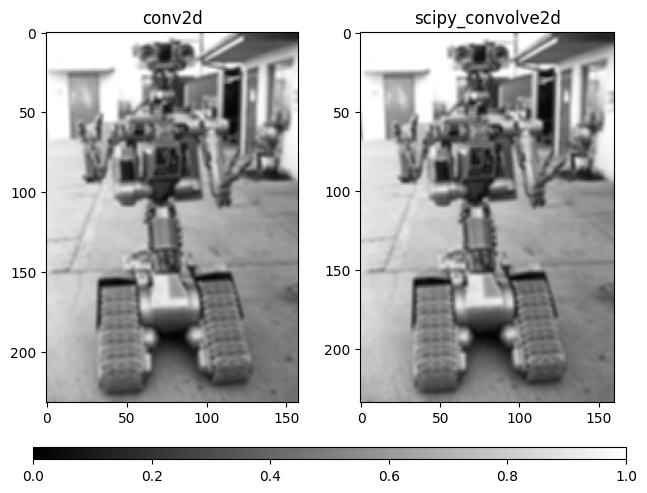

In [36]:
imshow_grid(conv2d=gray_convs['local averaging'], scipy_convolve2d=gray_gn_rscp);

- Does not work straightforwadly for RGB.
- The kernel must have the same number of channels as the input iamge.
- So, for example, we can apply it for each channel independently.

In [37]:
rgb_gn_rscp = np.zeros_like(rgb_gn)
for c in range(3):
    rgb_gn_rscp[:, :, c] = scipy.signal.convolve2d(
        rgb_gn[:, :, c],
        kernel,
        boundary='symm',
        mode='same'  # automatically computes padding
    )
rgb_gn_rscp.shape, rgb_gn_rscp.dtype, rgb_gn_rscp.min(), rgb_gn_rscp.max()

((234, 160, 3), dtype('float64'), 0.003340160302160314, 1.0000000000000002)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


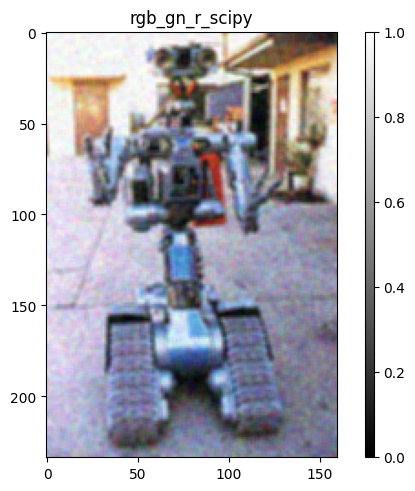

In [38]:
imshow_grid(rgb_gn_r_scipy=rgb_gn_rscp);

### OpenCV: `cv.filter2D`

https://docs.opencv.org/4.x/d4/d86/group__imgproc__filter.html

- By default corresponds to the `mode='same'` of `scipy.signal.convolve2d`.

In [39]:
gray_gn_rcv = cv.filter2D(gray_gn, -1, kernel, borderType=cv.BORDER_REFLECT)
gray_gn_rcv.shape, gray_gn_rcv.dtype, gray_gn_rcv.min(), gray_gn_rcv.max()

((234, 160), dtype('float64'), 0.008280681445121181, 1.0000000000000002)

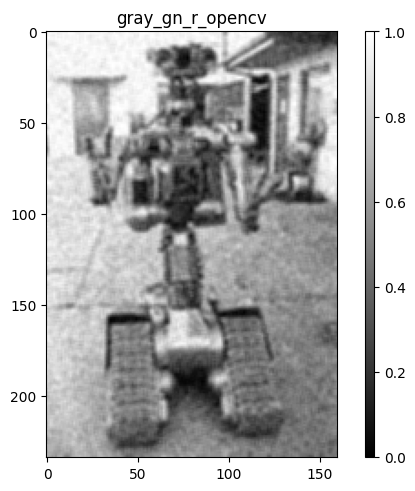

In [40]:
imshow_grid(gray_gn_r_opencv=gray_gn_rcv);

- Works for RGB images too.
- Automatically convolves for each channel independently.

In [41]:
rgb_gn_rcv = cv.filter2D(rgb_gn, -1, kernel, borderType=cv.BORDER_REFLECT)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


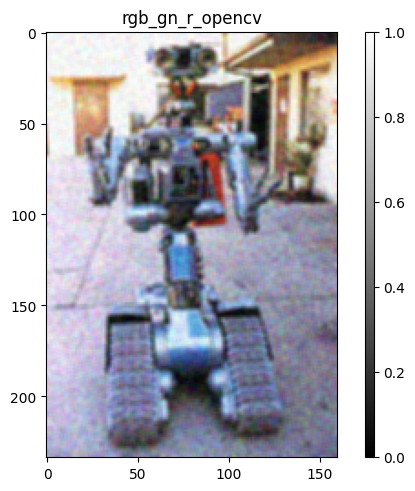

In [42]:
imshow_grid(rgb_gn_r_opencv=rgb_gn_rcv);

In [43]:
# Verify the result is the same as from scipy
np.sum(np.abs(rgb_gn_rcv - rgb_gn_rscp))

6.025577606316723e-12

In [44]:
# OpenCV is significantly faster
%timeit scipy.signal.convolve2d(gray, kernels['local averaging'], mode = 'same', boundary = 'symm')
%timeit cv.filter2D(gray, -1, kernels['local averaging'], borderType=cv.BORDER_REFLECT)

742 µs ± 6.44 µs per loop (mean ± std. dev. of 7 runs, 1,000 loops each)
70.6 µs ± 1.02 µs per loop (mean ± std. dev. of 7 runs, 10,000 loops each)


## Separable filters

- A direct consequence of associativity is the separability of linear filters.
- If a convolution kernel $h$ can be expressed as the convolution of multiple kernels $h_i$ in the form
  $$
  h = h_1 * h_2 * \ldots * h_F
  $$
  then the convolution $f * h$ may be performed as a series of convolutions
  $$
  f * h = ((f * h_1) * h_2) * \ldots * h_F
  $$
- This observation can significantly speed up computation in cases we can decompose $h$ in the aformentioned way.

In [45]:
def conv2d_sep(gray: np.ndarray, kernel1: np.ndarray, kernel2: np.ndarray) -> np.ndarray:
    out = scipy.signal.convolve2d(gray, kernel1)
    out = scipy.signal.convolve2d(out, kernel2)
    return out

### Separable box filter

- For example, the local averaging kernel
  $$
  h = \begin{bmatrix}
    1/9 & 1/9 & 1/9 \\
    1/9 & 1/9 & 1/9 \\
    1/9 & 1/9 & 1/9 \\
  \end{bmatrix}
  $$
  may be decomposed as
  $$
  h = h_x * h_y
  $$
  where
  $$
  h_x = \left[ 1/3, 1/3, 1/3 \right]
  \qquad \textrm{and} \qquad
  h_y = \begin{bmatrix}
    1/3 \\
    1/3 \\
    1/3
  \end{bmatrix}
  $$
- Why would we do this?
- When convolving with $h$ (full $3 \times 3$ filter), we need $3 \cdot 3 = 9$ multiplications for every pixel.
- When convolving with $h_x$ ($1 \times 3$ filter), we only need 3 multiplications per pixel.
- We also need to convolve with $h_y$ ($3 \times 1$ filter), which again amounts to 3 multiplications per pixel.
- This means that $(f * h_x) * h_y$ only requires $3 + 3 = 6$ multiplications per pixel instead of $9$, saving $1/3$ of computations.

In [46]:
kernel_x = 1/3 * np.ones((1, 3))
kernel_y = kernel_x.T
kernel = scipy.signal.convolve2d(kernel_x, kernel_y)
kernel_x, kernel_y, kernel

(array([[0.333, 0.333, 0.333]]),
 array([[0.333],
        [0.333],
        [0.333]]),
 array([[0.111, 0.111, 0.111],
        [0.111, 0.111, 0.111],
        [0.111, 0.111, 0.111]]))

In [47]:
gray_gn_rc = scipy.signal.convolve2d(gray_gn, kernel)  # full convolution
gray_gn_rsc = conv2d_sep(gray_gn, kernel_x, kernel_y)  # separable convolution
gray_gn_rsc.shape, gray_gn_rsc.dtype, gray_gn_rsc.min(), gray_gn_rsc.max()

((236, 162), dtype('float64'), 0.008280681445121181, 1.0)

In [48]:
# Are they the same?
np.sum(np.abs(gray_gn_rsc - gray_gn_rc))

2.1219710016895377e-12

In [49]:
# Is separable convolution faster?
%timeit scipy.signal.convolve2d(gray_gn, kernel)
%timeit conv2d_sep(gray_gn, kernel_x, kernel_y)

647 µs ± 15.6 µs per loop (mean ± std. dev. of 7 runs, 1,000 loops each)
759 µs ± 14.8 µs per loop (mean ± std. dev. of 7 runs, 1,000 loops each)


- In this case, we do not get any speed up, because the filter is too small.
- The overhead of calling the convolution twice with all the initializations overcomes the savings.

### Separable Gaussian filter

In [50]:
kernel_g = scipy.signal.windows.gaussian(11, 2.)
kernel_g /= kernel_g.sum()
kernel_g

array([0.009, 0.027, 0.065, 0.122, 0.177, 0.201, 0.177, 0.122, 0.065, 0.027, 0.009])

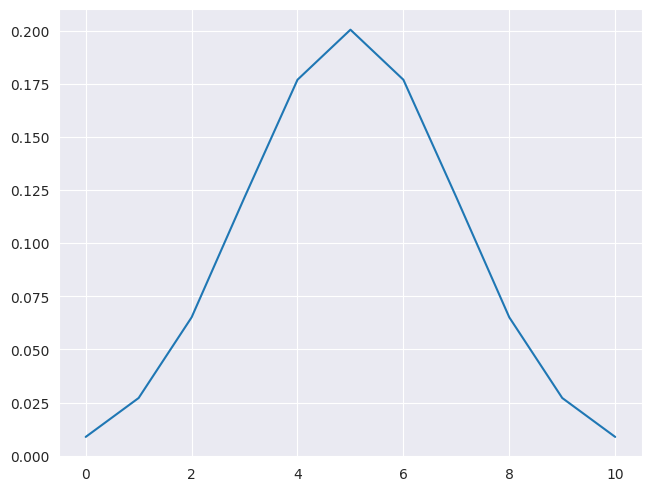

In [51]:
with sns.axes_style(style='darkgrid'):
    plt.plot(kernel_g, '-');

In [52]:
kernel_g2d = scipy.signal.convolve2d(kernel_g[None, :], kernel_g[:, None])
kernel_g2d.shape, kernel_g2d.sum()

((11, 11), 1.0000000000000004)

In [53]:
kernel_g2d

array([[0.   , 0.   , 0.001, 0.001, 0.002, 0.002, 0.002, 0.001, 0.001, 0.   , 0.   ],
       [0.   , 0.001, 0.002, 0.003, 0.005, 0.005, 0.005, 0.003, 0.002, 0.001, 0.   ],
       [0.001, 0.002, 0.004, 0.008, 0.012, 0.013, 0.012, 0.008, 0.004, 0.002, 0.001],
       [0.001, 0.003, 0.008, 0.015, 0.022, 0.024, 0.022, 0.015, 0.008, 0.003, 0.001],
       [0.002, 0.005, 0.012, 0.022, 0.031, 0.035, 0.031, 0.022, 0.012, 0.005, 0.002],
       [0.002, 0.005, 0.013, 0.024, 0.035, 0.04 , 0.035, 0.024, 0.013, 0.005, 0.002],
       [0.002, 0.005, 0.012, 0.022, 0.031, 0.035, 0.031, 0.022, 0.012, 0.005, 0.002],
       [0.001, 0.003, 0.008, 0.015, 0.022, 0.024, 0.022, 0.015, 0.008, 0.003, 0.001],
       [0.001, 0.002, 0.004, 0.008, 0.012, 0.013, 0.012, 0.008, 0.004, 0.002, 0.001],
       [0.   , 0.001, 0.002, 0.003, 0.005, 0.005, 0.005, 0.003, 0.002, 0.001, 0.   ],
       [0.   , 0.   , 0.001, 0.001, 0.002, 0.002, 0.002, 0.001, 0.001, 0.   , 0.   ]])

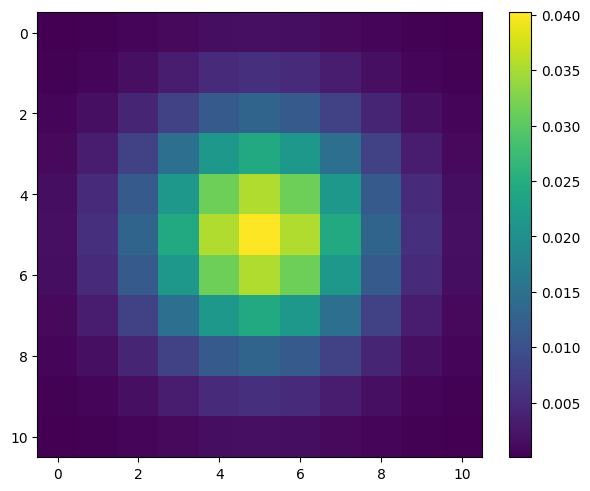

In [54]:
plt.imshow(kernel_g2d)
plt.colorbar();

In [55]:
# Verify again that separable convolution computes the same thing
np.sum(np.abs(conv2d_sep(gray_gn, kernel_g[None, :], kernel_g[:, None]) - scipy.signal.convolve2d(gray_gn, kernel_g2d)))

5.67593050501919e-12

In [56]:
# With larger kernel, there will be significant speed up
%timeit scipy.signal.convolve2d(gray_gn, kernel_g2d)
%timeit conv2d_sep(gray_gn, kernel_g[None, :], kernel_g[:, None])

5.55 ms ± 25.9 µs per loop (mean ± std. dev. of 7 runs, 100 loops each)
2.09 ms ± 32 µs per loop (mean ± std. dev. of 7 runs, 100 loops each)


- We can make separable convolution in Scipy even faster by using true 1D convolution.

In [57]:
def conv2d_sep_faster(img: np.ndarray, kernel1: np.ndarray, kernel2: np.ndarray) -> np.ndarray:
    # scipy.ndimage.convolve1d is faster than scipy.ndimage.convolve
    out = scipy.ndimage.convolve1d(img.T, kernel1)
    out = scipy.ndimage.convolve1d(out.T, kernel2)
    return out

In [58]:
# Verify again that separable convolution computes the same thing
np.sum(np.abs(conv2d_sep_faster(gray_gn, kernel_g, kernel_g) - scipy.signal.convolve2d(gray_gn, kernel_g2d, mode='same', boundary='symm')))

5.645622858096999e-12

In [59]:
# These do not compute exactly the same thing due to border handling
%timeit conv2d_sep(gray_gn, kernel_g[None, :], kernel_g[:, None])
%timeit conv2d_sep_faster(gray_gn, kernel_g, kernel_g)

2.09 ms ± 48.5 µs per loop (mean ± std. dev. of 7 runs, 100 loops each)
250 µs ± 5.2 µs per loop (mean ± std. dev. of 7 runs, 1,000 loops each)


# Nonlinear noise model

- Up until now, we have assumed an additive noise model, for which linear filtering techniques might be appropriate.
- However, the noise may also be of nonlinear nature.
- A classic example of nonlinear noise is salt & pepper that manifests as black and white spots at random locations in the image.

In [60]:
gray_s = skimage.util.random_noise(gray, mode='salt', amount=0.05)
gray_p = skimage.util.random_noise(gray, mode='pepper', amount=0.05)
gray_sp = skimage.util.random_noise(gray, mode='s&p', amount=0.05)
rgb_sp = skimage.util.random_noise(rgb, mode='s&p', amount=0.05)

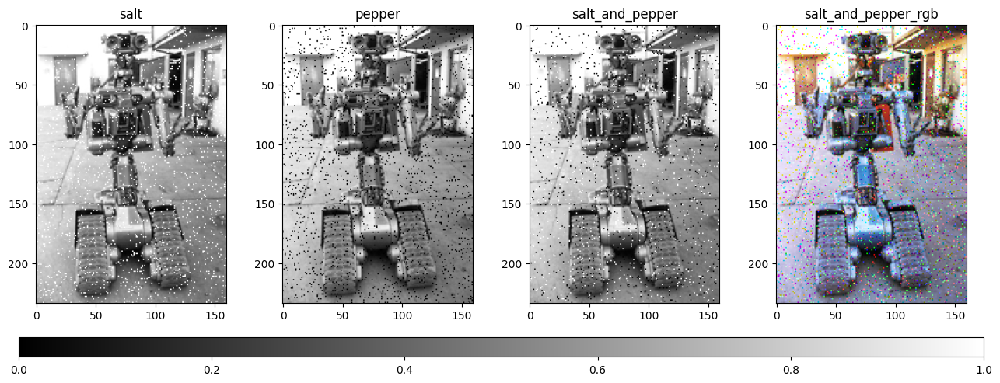

In [61]:
imshow_grid(salt=gray_s, pepper=gray_p, salt_and_pepper=gray_sp, salt_and_pepper_rgb=rgb_sp);

- Let's try linear filtering to remove the salt & peper noise.

In [62]:
gray_s_rlf = scipy.signal.convolve2d(gray_s, kernels['Gaussian-like averaging (blurring)'])
gray_p_rlf = scipy.signal.convolve2d(gray_p, kernels['Gaussian-like averaging (blurring)'])
gray_sp_rlf = scipy.signal.convolve2d(gray_sp, kernels['Gaussian-like averaging (blurring)'])

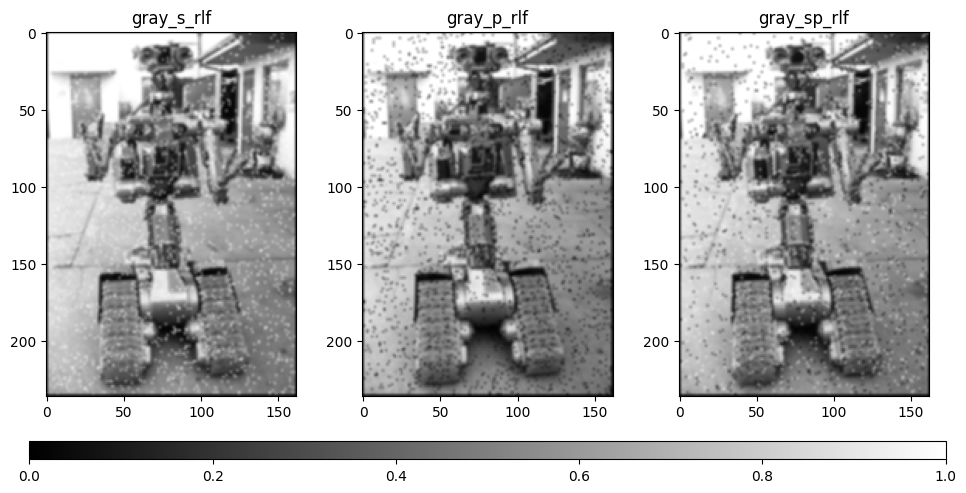

In [63]:
imshow_grid(gray_s_rlf=gray_s_rlf, gray_p_rlf=gray_p_rlf, gray_sp_rlf=gray_sp_rlf);

# Nonlinear filters

- Linear filters have a serious disadvantage of blurring the image and thus not preserving fine detail such as edges.
- Nonlinear filter can often smooth the image without degrading image quality.
- The essential characteristic is that the function to compute value of $g(m,n)$ based on some neighborhood is nonlinear.

## Min and max filters

- One of the simplest nonlinear filters are *minimum* and *maximum* filters, defined as
  $$
  g(m,n) = \min_{(i,j) \in \mathcal{H}}\{ f(m+i,n+j) \}
  $$
  and
  $$
  g(m,n) = \max_{(i,j) \in \mathcal{H}}\{ f(m+i,n+j) \}
  $$
- They simply look at some neighborhood $\mathcal{H}$ of pixel $(m,n)$ and then return its minimal or maximal value.

In [64]:
def min_filter(gray: np.ndarray, wnd_size: int) -> np.ndarray:
    # Init as copy so that we don't have to handle borders
    out = gray.copy()
    half = wnd_size // 2
    i_h, i_w = gray.shape[:2]
    for m in range(half, i_h - half):
        for n in range(half, i_w - half):
            window = gray[m-half:m+half+1, n-half:n+half+1]
            out[m, n] = window.min()
    return out

In [65]:
def max_filter(gray: np.ndarray, wnd_size: int) -> np.ndarray:
    # Init as copy so that we don't have to handle borders
    out = gray.copy()
    half = wnd_size // 2
    i_h, i_w = gray.shape[:2]
    for m in range(half, i_h - half):
        for n in range(half, i_w - half):
            window = gray[m-half:m+half+1, n-half:n+half+1]
            out[m, n] = window.max()  # here's the only difference from `min_filter`
    return out

In [66]:
gray_s_rmin = min_filter(gray_s, 3)
gray_s_rmax = max_filter(gray_s, 3)
gray_p_rmin = min_filter(gray_p, 3)
gray_p_rmax = max_filter(gray_p, 3)
gray_sp_rmin = min_filter(gray_sp, 3)
gray_sp_rmax = max_filter(gray_sp, 3)

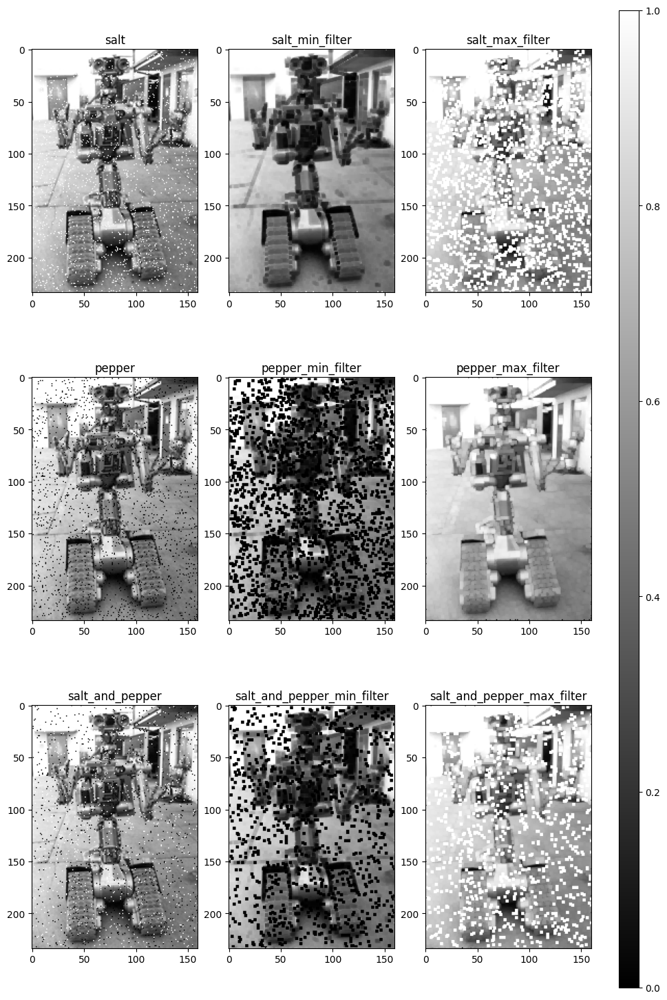

In [67]:
imshow_grid(
    3,
    salt=gray_s, salt_min_filter=gray_s_rmin, salt_max_filter=gray_s_rmax,
    pepper=gray_p, pepper_min_filter=gray_p_rmin, pepper_max_filter=gray_p_rmax,
    salt_and_pepper=gray_sp, salt_and_pepper_min_filter=gray_sp_rmin, salt_and_pepper_max_filter=gray_sp_rmax
);

- The filters can be applied sequentially to produce better results.
- This approach is called opening and closing and belongs to grayscale morphology, which we will explore in more detail in the lecture [morphology](morphology.ipynb).

In [68]:
# Grayscale opening
gray_sp_rmin = min_filter(gray_sp, 3)
gray_sp_ro = max_filter(gray_sp_rmin, 3)
# Grayscale closing
gray_sp_romax = max_filter(gray_sp_ro, 3)
gray_sp_roc = min_filter(gray_sp_romax, 3)

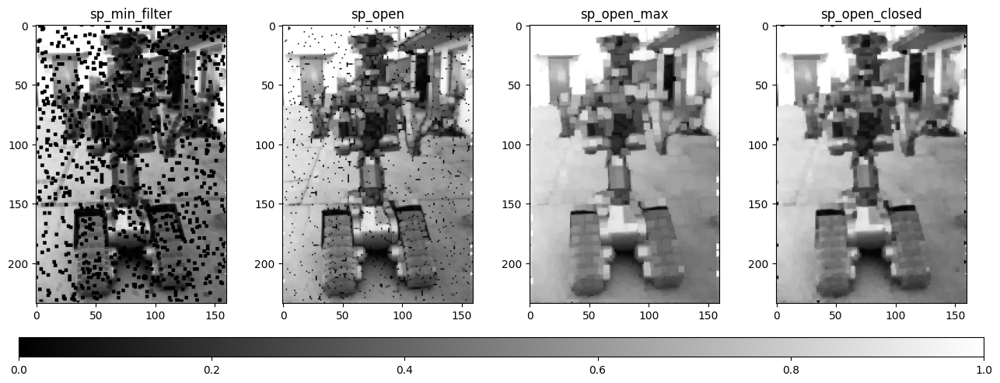

In [69]:
imshow_grid(sp_min_filter=gray_sp_rmin, sp_open=gray_sp_ro, sp_open_max=gray_sp_romax, sp_open_closed=gray_sp_roc);

## General `filter2d` function with arbitrary neighborhood shape

- By now we may notice that the filter functions are all very similar.
- For each pixel, we collect its neighborhood and then calculate the output value.
- The main difference between filters is the function for computation of the output value.
- Hence, we can create a general `filter2d` function with the following parameters
  - input image `img`,
  - `neighborhood` mask that will specify which neighboring pixels at each position $(m,n)$ should be used for computation of the output value,
    - This is called `footprint` in Scipy and Scikit-image, but has different names elsewhere, e.g. structuring element in mathematical morphology (MATLAB and OpenCV)
  - a callable function `fun` that will take the neighborhood window as input and output the result.

In [70]:
def filter2d(
        img: np.ndarray,
        fun: Callable[[np.ndarray, np.ndarray], np.ndarray],
        neighborhood: Union[int, np.ndarray]
) -> np.ndarray:
    # Init as copy so that we don't have to handle borders
    out = img.copy()
    if isinstance(neighborhood, int):
        neighborhood = np.ones((neighborhood, neighborhood), dtype=bool)
    h_y, h_x = neighborhood.shape[0] // 2, neighborhood.shape[1] // 2
    i_h, i_w = img.shape[:2]
    for m in range(h_y, i_h - h_y):
        for n in range(h_x, i_w - h_x):
            window = img[m-h_y:m+h_y+1, n-h_x:n+h_x+1]
            # Now we call the function passed by the user
            out[m, n] = fun(window, neighborhood)
    return out

In [71]:
mask = cv.getStructuringElement(cv.MORPH_CROSS, (3, 3))
mask = mask.astype(bool)
mask

array([[False,  True, False],
       [ True,  True,  True],
       [False,  True, False]])

In [72]:
gray_sp_rmin = filter2d(gray_sp, lambda w, m: w[m].min(), mask)
gray_sp_ro = filter2d(gray_sp_rmin, lambda w, m: w[m].max(), mask)
gray_sp_romax = filter2d(gray_sp_ro, lambda w, m: w[m].max(), mask)
gray_sp_roc = filter2d(gray_sp_romax, lambda w, m: w[m].min(), mask)

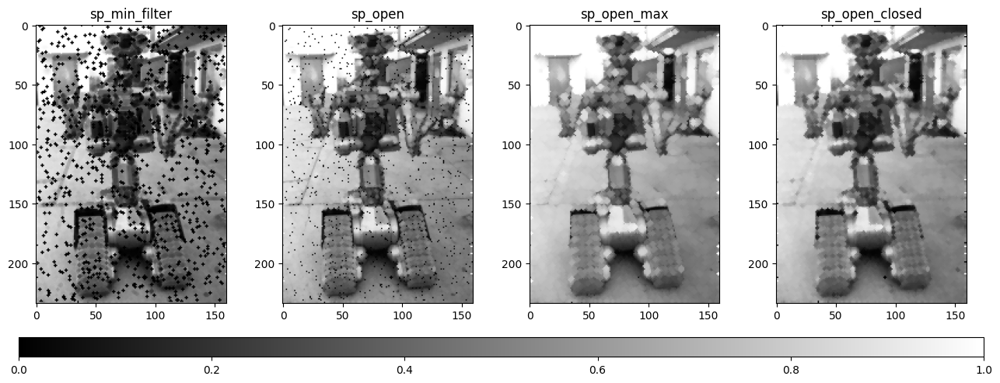

In [73]:
imshow_grid(sp_min_filter=gray_sp_rmin, sp_open=gray_sp_ro, sp_open_max=gray_sp_romax, sp_open_closed=gray_sp_roc);

## Median filter

- Median filter replaces every pixel by the median of the pixels in the current pixel's neighborhood, i.e.
  $$
  g(m,n) = \underset{(i,j) \in \mathcal{H}}{\textrm{median}}\{ f(m+i,n+j) \}
  $$

In [74]:
def median_filter(gray: np.ndarray, neighborhood: Union[int, np.ndarray]) -> np.ndarray:
    med_fn = lambda w, m: np.median(w[m])
    return filter2d(gray, med_fn, neighborhood)

In [75]:
gray_sp_rmed = median_filter(gray_sp, 3)
gray_sp_rmed.shape, gray_sp_rmed.dtype, gray_sp_rmed.min(), gray_sp_rmed.max()

((234, 160), dtype('float64'), 0.0, 1.0)

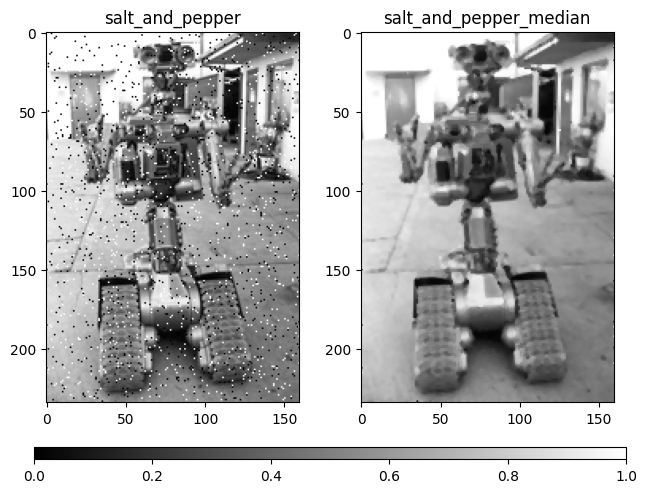

In [76]:
imshow_grid(salt_and_pepper=gray_sp, salt_and_pepper_median=gray_sp_rmed);

## Bilateral filter

$$
g(\bold{u}) = \frac{1}{W_\bold{u}} \sum_{\bold{v} \in \mathcal{H}}{ w_\textrm{int}(\|f(\bold{v}) - f(\bold{u})\|) \cdot w_\textrm{spatial}(\|\bold{v}-\bold{u}\|) \cdot f(\bold{v})},
$$
where
- $\bold{u} = [m,n]^\top$
- $\bold{v} = [i,j]^\top$
- $w_\textrm{int}$ is a function that weighs how different intensities (or colors) at positions $(m,n)$ and $(i,j)$ are; $w_\textrm{int}$ is usually a Gaussian function with $\sigma_\textrm{int}$,
- $w_\textrm{spatial}$ is a function that weighs how far apart positions $(x,y)$ and $(u,v)$ are; again, $w_\textrm{spatial}$ is usually a Gaussian function with $\sigma_\textrm{spatial}$,
- $\mathcal{H}$ is a local neigborhood of pixel $(m,n)$ around which the smoothing using $w_\textrm{int}$ and $w_\textrm{spatial}$ is performed,
- normalization factor $W_\bold{u}$ ensures pixel weights sum to 1.0:
$$
W_\bold{u} = \sum_{\bold{v} \in \mathcal{H}}{ w_\textrm{int}(\|f(\bold{v}) - f(\bold{u})\|) \cdot w_\textrm{spatial}(\|\bold{v}-\bold{u}\|) }
$$

In [77]:
rgb_gn_br = skimage.restoration.denoise_bilateral(rgb_gn, sigma_color=0.05, sigma_spatial=2.0, channel_axis=2)

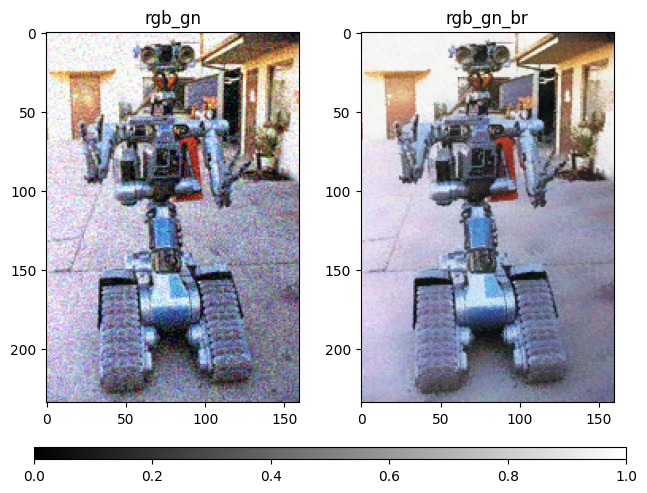

In [78]:
imshow_grid(rgb_gn=rgb_gn, rgb_gn_br=rgb_gn_br);

In [80]:
@ipywidgets.interact(
    img = ['rgb_gn', 'rgb_sp'],
    sigma_color = (0., 0.3, 0.01),
    sigma_spatial = (0., 30.),
    continuous_update = False
)
def denoise_bilateral_interact(img: str, sigma_color: float = 0.05, sigma_spatial: float = 2) -> None:
    img = rgb_gn if img == 'rgb_gn' else rgb_sp
    img_r = skimage.restoration.denoise_bilateral(
        img,
        sigma_color = sigma_color,
        sigma_spatial = sigma_spatial,
        channel_axis = 2
    )
    imshow_grid(img=img, img_br=img_r)

interactive(children=(Dropdown(description='img', options=('rgb_gn', 'rgb_sp'), value='rgb_gn'), FloatSlider(v…

## OpenCV

In [81]:
@ipywidgets.interact(
    img = ['rgb_gn', 'rgb_sp'],
    sigma_color = (0., 255.),
    sigma_spatial = (0., 30.),
    continuous_update = True
)
def denoise_bilateral_interact_cv(img, sigma_color: float = 128., sigma_spatial: float = 2.):
    img = rgb_gn if img == 'rgb_gn' else rgb_sp
    img = skimage.util.img_as_ubyte(img)
    img_r = cv.bilateralFilter(
        img,
        None,
        sigma_color,
        sigma_spatial
    )
    imshow_grid(img=img, img_br=img_r)

interactive(children=(Dropdown(description='img', options=('rgb_gn', 'rgb_sp'), value='rgb_gn'), FloatSlider(v…

## Non-local means filter

- Example from  
  https://scikit-image.org/docs/stable/auto_examples/filters/plot_nonlocal_means.html

In [84]:
# Algorithm needs to know approximate value of the standard deviation of the noise
sigma_est = np.mean(skimage.restoration.estimate_sigma(rgb_gn, channel_axis=2))
sigma_est

0.09325809558040431

In [85]:
# slow algorithm
rgb_gn_rnlm1 = skimage.restoration.denoise_nl_means(
    rgb_gn,
    h = 1.15 * sigma_est,  # threshold for comparing patch similarity
    fast_mode = False,
    patch_size = 5,
    patch_distance = 6,  # how far to search for similar patches
    channel_axis = 2
)

In [86]:
# slow algorithm, sigma provided
rgb_gn_rnlm2 = skimage.restoration.denoise_nl_means(
    rgb_gn,
    h = 0.8 * sigma_est,
    sigma = sigma_est,
    fast_mode = False,
    patch_size = 5,
    patch_distance = 6,
    channel_axis = 2
)

In [87]:
# fast algorithm
rgb_gn_rnlm3 = skimage.restoration.denoise_nl_means(
    rgb_gn,
    h = 0.8 * sigma_est,
    fast_mode = True,
    patch_size = 5,
    patch_distance = 6,
    channel_axis = 2
)

In [88]:
# fast algorithm, sigma provided
rgb_gn_rnlm4 = skimage.restoration.denoise_nl_means(
    rgb_gn,
    h = 0.6 * sigma_est,
    sigma = sigma_est,
    fast_mode = True,
    patch_size = 5,
    patch_distance = 6,
    channel_axis = 2
)

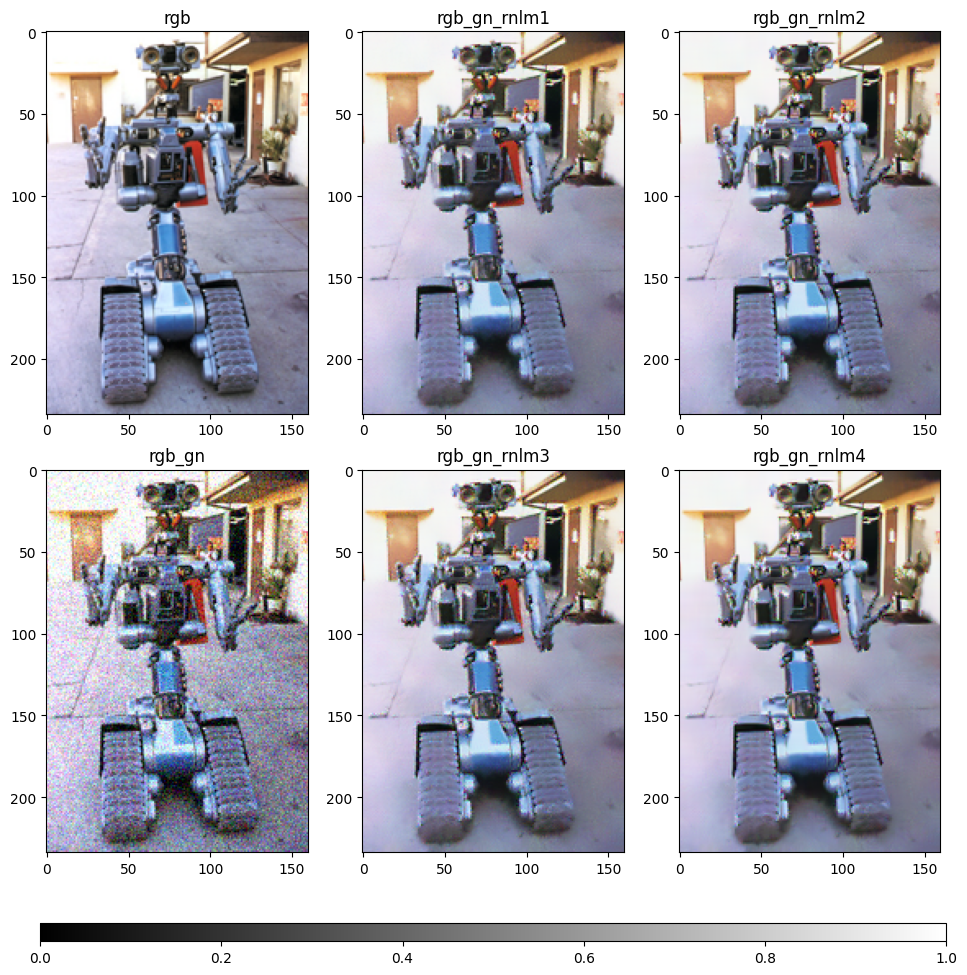

In [91]:
imshow_grid(
    2,
    rgb=rgb, rgb_gn_rnlm1=rgb_gn_rnlm1, rgb_gn_rnlm2=rgb_gn_rnlm2,
    rgb_gn=rgb_gn, rgb_gn_rnlm3=rgb_gn_rnlm3, rgb_gn_rnlm4=rgb_gn_rnlm4
);